In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation
from tqdm import tqdm_notebook as tqdm
from IPython.display import clear_output, HTML
import scipy.integrate as integrate

In [2]:
def animate(U, x0, x1):
    x = np.linspace(x0, x1, U.shape[1])
    def animate(data):
        y = data
        line.set_data(x,y)
        return line,

    fig = plt.figure();
    ax = plt.axes(xlim=(x0, x1), ylim=(U.min(), U.max()), xlabel=('$x$'), ylabel=('$u(x)$'));
    line, = plt.plot([],[]);

    return animation.FuncAnimation(fig, animate, frames=U, interval=100);

In [3]:
def KIR(x0, x1, nx, t0, t1, C, a, f, U_init, U0, U1):
    dx = (x1 - x0) / (nx - 1)
    dt = dx * C / abs(a)
    nt = int((t1 - t0) / dt) + 2

    x = np.linspace(x0, x1, nx)
    U = np.zeros((nt, nx))
    U[0] = U_init(x)

    for i in range(nt - 1):
        t = t0 + i * dt
        if a > 0:
            U[i,0] = U0(t)
            U[i+1,1:] = U[i,1:] - dt * (a * (U[i,1:] - U[i,:-1]) / dx - f(U[i,1:], x[1:], t))
        else:
            U[i+1,:-1] = U[i,:-1] - dt * (a * (U[i,1:] - U[i,:-1]) / dx - f(U[i,:-1], x[:-1], t))
            U[i,-1] = U1(t)
    return U

# Task 1

In [4]:
def KIR_central(x0, x1, nx, t0, t1, C, a, f, U_init, U0, U1):
    dx = (x1 - x0) / (nx - 1)
    dt = dx * C / abs(a)
    nt = int((t1 - t0) / dt) + 2

    x = np.linspace(x0, x1, nx)
    U = np.zeros((nt, nx))
    U[0] = U_init(x)

    for i in range(nt - 1):
        t = t0 + i * nt
        U[i,0] = U0(t)
        U[i+1,1:-1] = U[i,1:-1] - dt * (a * (U[i,2:] - U[i,:-2]) / (2*dx) - f(U[i,1:-1], x[1:-1], t))
        U[i,-1] = U1(t)
    return U

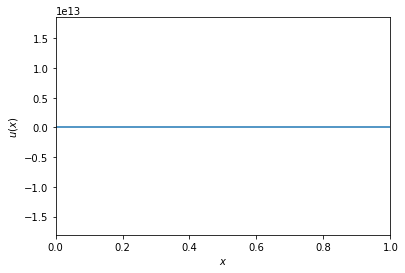

In [5]:
U = KIR_central(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 1, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)
anim = animate(U, 0, 1)
HTML(anim.to_jshtml())

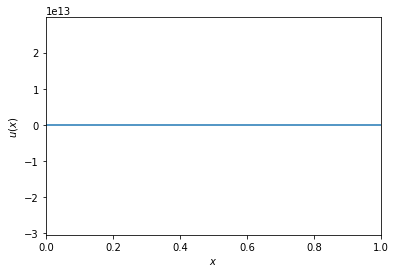

In [6]:
U = KIR_central(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 1.03, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)
anim = animate(U, 0, 1)
HTML(anim.to_jshtml())

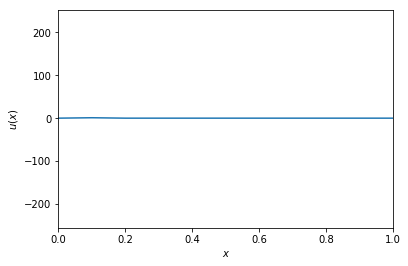

In [7]:
U = KIR_central(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 0.2, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)
anim = animate(U, 0, 1)
HTML(anim.to_jshtml())

# Task 2

In [8]:
N = 101
c_begin = 1
c_end = 2
C_var = np.linspace(c_begin, c_end, N)
U_res = []
for i in range(N):
    tmp = KIR(
        x0 = 0,
        x1 = 1,
        nx = 101,
        t0 = 0,
        t1 = 1,
        C = C_var[i], # Число Куранта
        a = 1, # Ut + a Ux = f(U, x, t)
        f = lambda U, x, t: 0, # Неоднородность
        U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
        U0 = lambda t: 0, # Левое ГУ
        U1 = lambda t: 0, # Правое ГУ
    )
    U_res.append(tmp)

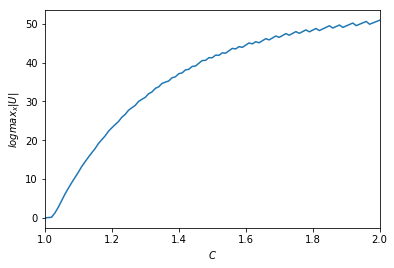

In [9]:
logs = []
for i in range(N):
    logs.append(np.log(np.abs(U_res[i]).max()))
plt.axes(xlim=(c_begin, c_end), xlabel=('$C$'), ylabel=('$log max_x |U|$'));
plt.plot(C_var, logs)

In [10]:
U_res = []
for i in range(N):
    tmp = KIR(
        x0 = 0,
        x1 = 1,
        nx = 101,
        t0 = 0,
        t1 = 1,
        C = C_var[i], # Число Куранта
        a = 1, # Ut + a Ux = f(U, x, t)
        f = lambda U, x, t: 0, # Неоднородность
        U_init = lambda x: np.where(0.5 < np.abs(x), 0, 1), # Начальное значение
        U0 = lambda t: 0, # Левое ГУ
        U1 = lambda t: 0, # Правое ГУ
    )
    U_res.append(tmp)

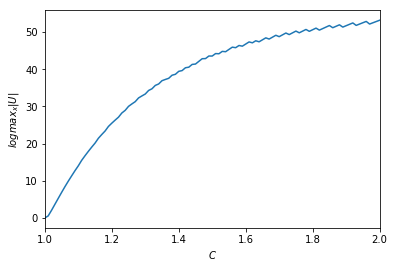

In [11]:
logs = []
for i in range(N):
    logs.append(np.log(np.abs(U_res[i]).max()))
plt.axes(xlim=(c_begin, c_end), xlabel=('$C$'), ylabel=('$log max_x |U|$'));
plt.plot(C_var, logs)

# Task 3

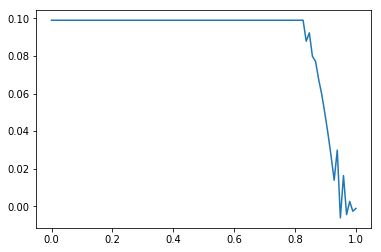

In [12]:
x0 = 0
x1 = 1
t0 = 0
t1 = 1

U = KIR(
    x0 = x0,
    x1 = x1,
    nx = 101,
    t0 = t0,
    t1 = t1,
    C = 1.03, # Число Куранта
    a = 1, # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)

I = np.zeros(U.shape[0])
dx = (x1-x0)/U.shape[1]
for i in range(U.shape[1]):
    I += U[:,i]*dx
t = np.linspace(t0, t1, U.shape[0])
plt.plot(t, I)

# Task 5

In [13]:
def LW(x0, x1, nx, t0, t1, C, a, f, U_init, U0, U1):
    dx = (x1 - x0) / (nx - 1)
    dt = dx * C / 1
    nt = int((t1 - t0) / dt) + 2

    x = np.linspace(x0, x1, nx)
    U = np.zeros((nt, nx))
    U[0] = U_init(x)

    for i in range(nt - 1):
        t = t0 + i * dt
        U[i,0] = U0(t)
        U[i+1,1:-1] = U[i,1:-1] - dt * a(t) * (U[i,2:] - U[i,:-2]) / (2 * dx) + \
                      0.5 * dt ** 2 * a(t) ** 2 * (U[i,2:] - 2 * U[i,1:-1] + U[i,:-2]) / dx ** 2 - \
                      dt * f(U[i,1:-1], x[1:-1], t)
        U[i,-1] = U1(t)
        
    return U

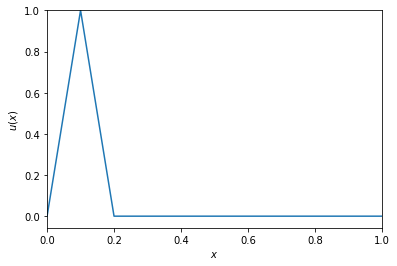

In [14]:
U = LW(
    x0 = 0,
    x1 = 1,
    nx = 101,
    t0 = 0,
    t1 = 1,
    C = 0.2, # Число Куранта
    a = lambda t: np.sin(2*np.pi*t), # Ut + a Ux = f(U, x, t)
    f = lambda U, x, t: 0, # Неоднородность
    U_init = lambda x: np.where(1 < 10 * np.abs(x - 0.1), 0, 1 - 10 * np.abs(x - 0.1)), # Начальное значение
    U0 = lambda t: 0, # Левое ГУ
    U1 = lambda t: 0, # Правое ГУ
)
anim = animate(U, 0, 1)
HTML(anim.to_jshtml())